In [ ]:
!icacls "C:\Users\PC\.kaggle\kaggle.json" /inheritance:r /grant:r "%username%:R"

In [ ]:
!icacls "C:\Users\PC\.kaggle\kaggle.json"


In [ ]:
!kaggle datasets download -d snehaanbhawal/resume-dataset

In [3]:
import zipfile
with zipfile.ZipFile("resume-dataset.zip", 'r') as zip_ref:
    zip_ref.extractall("./")

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [27]:
df = pd.read_csv("./Resume/resume.csv")
df

,ID,Resume_str,Resume_html,Category
0,16852973,HR ADMINISTRATOR/MARKETING ASSOCIATE\...,"<div class=""fontsize fontface vmargins hmargin...",HR
1,22323967,"HR SPECIALIST, US HR OPERATIONS ...","<div class=""fontsize fontface vmargins hmargin...",HR
2,33176873,HR DIRECTOR Summary Over 2...,"<div class=""fontsize fontface vmargins hmargin...",HR
3,27018550,HR SPECIALIST Summary Dedica...,"<div class=""fontsize fontface vmargins hmargin...",HR
4,17812897,HR MANAGER Skill Highlights ...,"<div class=""fontsize fontface vmargins hmargin...",HR
...,...,...,...,...
2479,99416532,RANK: SGT/E-5 NON- COMMISSIONED OFFIC...,"<div class=""fontsize fontface vmargins hmargin...",AVIATION
2480,24589765,"GOVERNMENT RELATIONS, COMMUNICATIONS ...","<div class=""fontsize fontface vmargins hmargin...",AVIATION
2481,31605080,GEEK SQUAD AGENT Professional...,"<div class=""fontsize fontface vmargins hmargin...",AVIATION
2482,21190805,PROGRAM DIRECTOR / OFFICE MANAGER ...,"<div class=""fontsize fontface vmargins hmargin...",AVIATION


In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2484 entries, 0 to 2483
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   ID           2484 non-null   int64 
 1   Resume_str   2484 non-null   object
 2   Resume_html  2484 non-null   object
 3   Category     2484 non-null   object
dtypes: int64(1), object(3)
memory usage: 77.8+ KB


In [29]:
df.pop('ID')
df.pop('Resume_html')
df.head()

,Resume_str,Category
0,HR ADMINISTRATOR/MARKETING ASSOCIATE\...,HR
1,"HR SPECIALIST, US HR OPERATIONS ...",HR
2,HR DIRECTOR Summary Over 2...,HR
3,HR SPECIALIST Summary Dedica...,HR
4,HR MANAGER Skill Highlights ...,HR


In [30]:
df['Category'].value_counts()

Category
INFORMATION-TECHNOLOGY    120
BUSINESS-DEVELOPMENT      120
FINANCE                   118
ADVOCATE                  118
ACCOUNTANT                118
ENGINEERING               118
CHEF                      118
AVIATION                  117
FITNESS                   117
SALES                     116
BANKING                   115
HEALTHCARE                115
CONSULTANT                115
CONSTRUCTION              112
PUBLIC-RELATIONS          111
HR                        110
DESIGNER                  107
ARTS                      103
TEACHER                   102
APPAREL                    97
DIGITAL-MEDIA              96
AGRICULTURE                63
AUTOMOBILE                 36
BPO                        22
Name: count, dtype: int64

In [31]:
df['Category'].unique()

array(['HR', 'DESIGNER', 'INFORMATION-TECHNOLOGY', 'TEACHER', 'ADVOCATE',
       'BUSINESS-DEVELOPMENT', 'HEALTHCARE', 'FITNESS', 'AGRICULTURE',
       'BPO', 'SALES', 'CONSULTANT', 'DIGITAL-MEDIA', 'AUTOMOBILE',
       'CHEF', 'FINANCE', 'APPAREL', 'ENGINEERING', 'ACCOUNTANT',
       'CONSTRUCTION', 'PUBLIC-RELATIONS', 'BANKING', 'ARTS', 'AVIATION'],
      dtype=object)

In [32]:
remove = np.array(['AVIATION', 'BPO','AUTOMOBILE','AGRICULTURE'])
df = df[~df['Category'].isin(remove)]

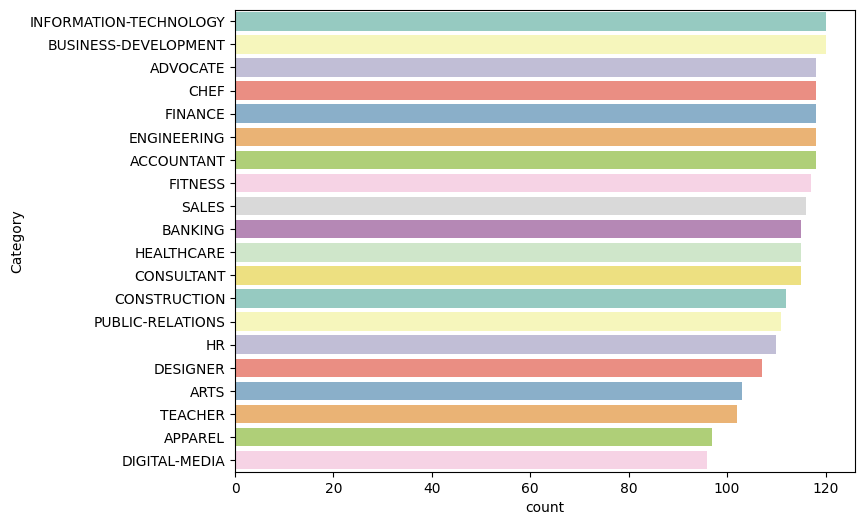

In [33]:
plt.figure(figsize=(8,6))
sns.countplot(y="Category" , palette="Set3", data=df, order = df['Category'].value_counts().index);

## prepocesing data
Pemrosesan awal¶
Pada tahap ini, saya mengikuti proses pembersihan dasar untuk analisis teks yang meliputi:

1. mengubah karakter menjadi huruf kecil.
2. hapus tanda baca, angka dan bahasa asing.
3. tokenisasi kata. (membagi kalimat menjadi unigram)
4. kata yang berasal. (konversi ke bentuk kata infleksi yang biasanya merupakan bentuk akar)

In [34]:
import re

def cleanResume(txt):
    """
    Membersihkan teks resume dari elemen-elemen yang tidak diinginkan.
    
    Args:
    txt (str): Teks resume yang akan dibersihkan.
    
    Returns:
    str: Teks resume yang telah dibersihkan.
    """
    # Menghapus tautan (URL)
    cleanText = re.sub('http\S+\s', ' ', txt)
    # Menghapus 'RT' dan 'cc'
    cleanText = re.sub('RT|cc', ' ', cleanText)
    # Menghapus hashtag
    cleanText = re.sub('#\S+\s', ' ', cleanText)
    # Menghapus username
    cleanText = re.sub('@\S+', '  ', cleanText)  
    # Menghapus karakter spesial
    cleanText = re.sub('[%s]' % re.escape("""!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~"""), ' ', cleanText)
    # Menghapus karakter non-ASCII
    cleanText = re.sub(r'[^\x00-\x7f]', ' ', cleanText) 
    # Mengganti spasi berulang dengan satu spasi
    cleanText = re.sub('\s+', ' ', cleanText)
    
    return cleanText


In [35]:
# preprocessing text
df.loc[:,'Resume'] = df['Resume_str'].apply(lambda w: cleanResume(w))
# drop original text column
df.pop('Resume_str')
df

C:\Users\PC\AppData\Local\Temp\ipykernel_40208\3675170120.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:,'Resume'] = df['Resume_str'].apply(lambda w: cleanResume(w))


,Category,Resume
0,HR,HR ADMINISTRATOR MARKETING ASSOCIATE HR ADMIN...
1,HR,HR SPECIALIST US HR OPERATIONS Summary Versat...
2,HR,HR DIRECTOR Summary Over 20 years experience ...
3,HR,HR SPECIALIST Summary Dedicated Driven and Dy...
4,HR,HR MANAGER Skill Highlights HR SKILLS HR Depa...
...,...,...
2362,ARTS,AUDIO VISUAL TECHNICIAN Summary Proficient in...
2363,ARTS,GENERAL MANAGER Executive Summary To secure a...
2364,ARTS,ADMINISTRATIVE ASSISTANT SITE CLERK Career Ov...
2365,ARTS,COORDINATOR DONOR RELATIONS Summary Highly or...


In [36]:
df['Resume'][0]

' HR ADMINISTRATOR MARKETING ASSOCIATE HR ADMINISTRATOR Summary Dedicated Customer Service Manager with 15 years of experience in Hospitality and Customer Service Management Respected builder and leader of customer focused teams strives to instill a shared enthusiastic commitment to customer service Highlights Focused on customer satisfaction Team management Marketing savvy Conflict resolution techniques Training and development Skilled multi tasker Client relations specialist A omplishments Missouri DOT Supervisor Training Certification Certified by IHG in Customer Loyalty and Marketing by Segment Hilton Worldwide General Manager Training Certification A omplished Trainer for cross server hospitality systems such as Hilton OnQ Micros Opera PMS Fidelio OPERA Reservation System ORS Holidex Completed courses and seminars in customer service sales strategies inventory control loss prevention safety time management leadership and performance assessment Experience HR Administrator Marketing

In [37]:
import string
df.loc[:, 'Resume'] = df['Resume'].apply(lambda wrd: [ltrs.lower() for ltrs in wrd if ltrs not in string.punctuation])
df.loc[:, 'Resume'] = df['Resume'].apply(lambda wrd: ''.join(wrd))

In [38]:
import nltk
from nltk.stem import WordNetLemmatizer

# Inisialisasi objek lemmatizer
lemmatizer = WordNetLemmatizer()

# Pastikan kolom 'Resume' berisi teks dalam format string
df.loc[:,'Resume'] = df['Resume'].astype(str)

# Fungsi untuk melakukan lemmatisasi pada satu kalimat
def lemmatize_sentence(sentence):
    words = nltk.word_tokenize(sentence)
    lemmatized_words = [lemmatizer.lemmatize(word) for word in words]
    return ' '.join(lemmatized_words)


In [39]:
# Terapkan lemmatisasi pada kolom 'Resume'
df['Resume'] = df['Resume'].apply(lemmatize_sentence)

C:\Users\PC\AppData\Local\Temp\ipykernel_40208\1639163729.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Resume'] = df['Resume'].apply(lemmatize_sentence)


In [40]:
df

,Category,Resume
0,HR,hr administrator marketing associate hr admini...
1,HR,hr specialist u hr operation summary versatile...
2,HR,hr director summary over 20 year experience in...
3,HR,hr specialist summary dedicated driven and dyn...
4,HR,hr manager skill highlight hr skill hr departm...
...,...,...
2362,ARTS,audio visual technician summary proficient in ...
2363,ARTS,general manager executive summary to secure a ...
2364,ARTS,administrative assistant site clerk career ove...
2365,ARTS,coordinator donor relation summary highly orga...


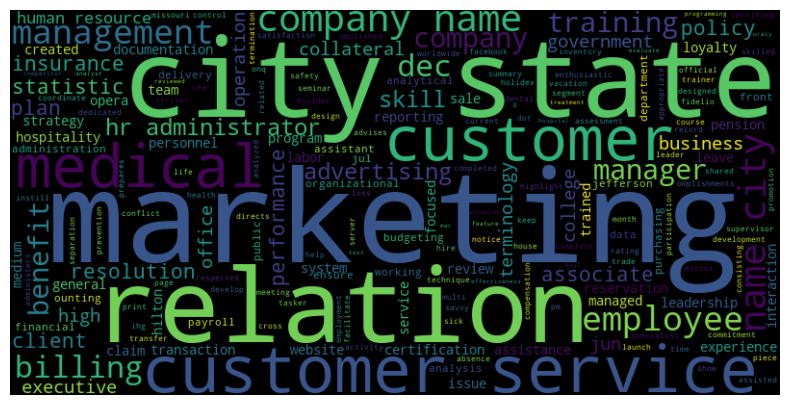

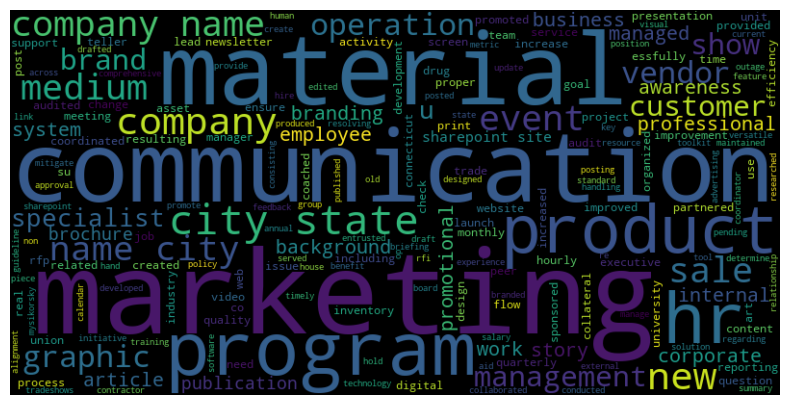

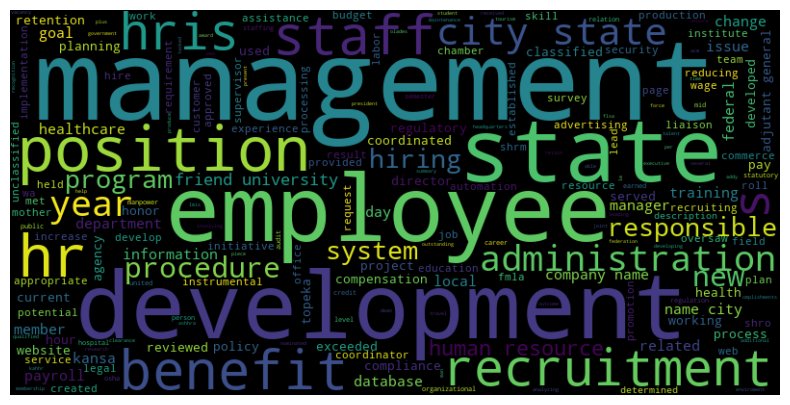

In [41]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def generate_wordcloud(text):
    # Inisialisasi objek WordCloud
    wordcloud = WordCloud(width=800, height=400, background_color='black').generate(text)

    # Tampilkan word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

# Pastikan kolom 'Resume' berisi teks dalam format string
df.loc[:,'Resume'] = df['Resume'].astype(str)

# Ambil data pertama hingga data kesepuluh dari kolom 'Resume'
for i in range(3):
    teks_resume = df['Resume'].iloc[i]
    generate_wordcloud(teks_resume)


In [50]:
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer()
tokenizer.fit_on_texts(df['Resume'])
sequences = tokenizer.texts_to_sequences(df['Resume'])
word_index = tokenizer.word_index
print(word_index)


{'and': 1, 'to': 2, 'a': 3, 'of': 4, 'the': 5, 'for': 6, 'in': 7, 'with': 8, 'state': 9, 'company': 10, 'city': 11, 'management': 12, 'name': 13, 'customer': 14, 'on': 15, 'service': 16, 'sale': 17, 'all': 18, 'business': 19, 'skill': 20, 'project': 21, 'team': 22, 'system': 23, 'by': 24, 'client': 25, 'new': 26, 's': 27, 'development': 28, 'manager': 29, 'experience': 30, 'training': 31, 'process': 32, 'work': 33, 'product': 34, 'i': 35, 'program': 36, 'marketing': 37, 'employee': 38, 'information': 39, 'that': 40, 'office': 41, 'financial': 42, 'or': 43, 'including': 44, 'professional': 45, 'staff': 46, 'education': 47, 'support': 48, 'from': 49, 'report': 50, 'at': 51, 'communication': 52, 'design': 53, 'year': 54, 'data': 55, 'student': 56, 'operation': 57, 'managed': 58, 'university': 59, 'plan': 60, 'quality': 61, 'developed': 62, 'analysis': 63, 'an': 64, 'member': 65, 'budget': 66, 'ounting': 67, 'time': 68, 'high': 69, 'ounts': 70, '01': 71, 'department': 72, 'microsoft': 73, 

In [17]:
from tensorflow.keras.preprocessing.text import Tokenizer
# Tokenize the data (Tokenisasi Data)
tokenizer = Tokenizer(num_words=2000)
tokenizer.fit_on_texts(df['Resume'])
train = tokenizer.texts_to_sequences(df['Resume'])


In [18]:
train

[[197,
  611,
  37,
  159,
  197,
  611,
  131,
  914,
  14,
  16,
  29,
  8,
  735,
  54,
  4,
  30,
  7,
  1530,
  1,
  14,
  16,
  12,
  1981,
  1,
  348,
  4,
  14,
  604,
  22,
  2,
  3,
  1783,
  1485,
  1784,
  2,
  14,
  16,
  286,
  604,
  15,
  14,
  359,
  22,
  12,
  37,
  891,
  444,
  420,
  31,
  1,
  28,
  677,
  373,
  25,
  119,
  250,
  3,
  290,
  355,
  31,
  322,
  272,
  24,
  7,
  14,
  1737,
  1,
  37,
  24,
  1961,
  149,
  29,
  31,
  322,
  3,
  1427,
  830,
  6,
  504,
  217,
  1530,
  23,
  145,
  3,
  23,
  43,
  328,
  337,
  1,
  1013,
  7,
  14,
  16,
  17,
  86,
  112,
  116,
  871,
  1434,
  169,
  68,
  12,
  98,
  1,
  90,
  441,
  30,
  197,
  611,
  37,
  159,
  197,
  611,
  1311,
  92,
  2,
  75,
  10,
  13,
  11,
  9,
  340,
  2,
  184,
  85,
  1,
  443,
  94,
  145,
  3,
  756,
  804,
  793,
  119,
  252,
  31,
  1,
  38,
  16,
  1834,
  38,
  1,
  255,
  223,
  812,
  105,
  4,
  252,
  60,
  1606,
  145,
  3,
  309,
  1,
  60,
  214,
  402,

In [19]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
# Melakukan proses padding pada data
x_train = pad_sequences(train)
# Menampilkan hasil padding
print(x_train)

[[   0    0    0 ...  140 1337  374]
 [   0    0    0 ...   53  374 1331]
 [   0    0    0 ...  291  945   28]
 ...
 [   0    0    0 ...  228   55  360]
 [   0    0    0 ...  943 1280 1173]
 [   0    0    0 ...    9  157   16]]


# words into categorical values

In [51]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

le.fit(df['Category'])
y_train = le.transform(df['Category'])
print(y_train)

[15 15 15 ...  3  3  3]


In [53]:
# Melihat hasil input pada data teks
input_shape = word_index.shape[1]
print(input_shape)

AttributeError: 'dict' object has no attribute 'shape'

In [22]:
# Melakukan definisi tiap kalimat dan kata pada data teks
vocabulary = len(tokenizer.word_index)
print("number of unique words : ", vocabulary)

# Melakukan pemeriksaan pada data output label teks
output_length = le.classes_.shape[0]
print("output length: ", output_length)

number of unique words :  33768
output length:  20


In [23]:
import pickle
pickle.dump(le, open('label_encoder.pkl','wb'))
pickle.dump(tokenizer, open('tokenizers.pkl','wb'))

In [91]:
import tensorflow as tf
from tensorflow.keras.preprocessing.sequence import pad_sequences
# Padding sequence agar memiliki panjang yang sama
maxlen = 100
padded_sequences = pad_sequences(sequences, maxlen=maxlen)

model = tf.keras.Sequential([
    tf.keras.layers.Embedding(len(word_index) + 1, 128, input_length=maxlen),  # Meningkatkan ukuran embedding
    tf.keras.layers.LSTM(128, return_sequences=True),  # Meningkatkan jumlah neuron LSTM
    tf.keras.layers.Dropout(0.2),  # Mengurangi tingkat dropout
    tf.keras.layers.LSTM(64),  # Mengurangi jumlah neuron LSTM kedua
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.2),  
    tf.keras.layers.Dense(len(set(df['Category'])), activation='softmax')
])

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


In [92]:
# Melatih model
model.fit(padded_sequences, y_train, epochs=20, batch_size=16)

Epoch 1/20
141/141 [==============================] - 19s 104ms/step - loss: 2.9297 - accuracy: 0.0748
Epoch 2/20
141/141 [==============================] - 15s 107ms/step - loss: 2.7185 - accuracy: 0.1465
Epoch 3/20
141/141 [==============================] - 15s 108ms/step - loss: 2.3054 - accuracy: 0.2413
Epoch 4/20
141/141 [==============================] - 16s 116ms/step - loss: 1.9898 - accuracy: 0.3308
Epoch 5/20
141/141 [==============================] - 16s 111ms/step - loss: 1.6522 - accuracy: 0.4372
Epoch 6/20
141/141 [==============================] - 16s 114ms/step - loss: 1.3569 - accuracy: 0.5289
Epoch 7/20
141/141 [==============================] - 18s 126ms/step - loss: 1.0797 - accuracy: 0.6438
Epoch 8/20
141/141 [==============================] - 18s 130ms/step - loss: 0.8222 - accuracy: 0.7342
Epoch 9/20
141/141 [==============================] - 17s 119ms/step - loss: 0.6435 - accuracy: 0.8152
Epoch 10/20
141/141 [==============================] - 18s 125ms/step - l

In [93]:
import PyPDF2

# Fungsi untuk mengekstrak teks dari dokumen PDF
def extract_text_from_pdf(pdf_path):
    text = ''
    with open(pdf_path, 'rb') as pdf_file:
        pdf_reader = PyPDF2.PdfReader(pdf_file)
        for page_num in range(len(pdf_reader.pages)):
            page = pdf_reader.pages[page_num]
            text += page.extract_text()
    return text

# Path ke dokumen PDF yang ingin diuji
pdf_path = 'mycv.pdf'  

# Ekstrak teks dari PDF
cv_text = extract_text_from_pdf(pdf_path)
print(cv_text)

PRE-PRESS GRAPHIC DESIGNER
Summary
Creative, hardworking designer seeking a full-time desktop job, educated as a graphic artist, past experience in business world as a desktop
publisher laying out designs for printed mail and advertisements, in local government designing new websites with graphics for different agencies
within the system, and later for the same government printing and reproduction center creating documents to be printed off a press or copiers.
Skills
Adobe InDesign, Photoshop, Illustrator, and Acrobat Professional
Strongly familiar with Microsoft Word, Excel, PowerPoint, and Publisher / also QuarkXPress
Basic knowledge of web development with Adobe Dreamweaver, HTML, WordPress
Able to perform graphic design and administrative functions
Able to work as a team player and independently
Experienced using phone, fax, email, copiers and printers
Provides excellent customer service (in-person, by phone, email, or interoffice mail)
Prioritizes and calmly handles multiple proje

In [99]:
num_categories = len(df['Category'].unique())
print("Number of Categories in DataFrame:", num_categories)
print("Number of Output Neurons in Model:", model.layers[-1].output_shape[1])


Number of Categories in DataFrame: 20
Number of Output Neurons in Model: 20


In [101]:


# Tokenisasi teks baru
new_sequences = tokenizer.texts_to_sequences(cv_text)

# Padding sequence agar memiliki panjang yang sama
padded_new_sequences = pad_sequences(new_sequences, maxlen=maxlen)

# Melakukan prediksi menggunakan model
predictions = model.predict(padded_new_sequences)

predicted_classes = np.argmax(predictions, axis=1)
print("Predicted Classes:", predicted_classes)





120/120 [==============================] - 4s 37ms/step
Predicted Classes: [5 5 5 ... 5 5 5]


In [28]:
# Menampilkan parameter pada model LSTM
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 4334)]            0         
                                                                 
 embedding (Embedding)       (None, 4334, 10)          337690    
                                                                 
 lstm (LSTM)                 (None, 4334, 10)          840       
                                                                 
 flatten (Flatten)           (None, 43340)             0         
                                                                 
 dense (Dense)               (None, 20)                866820    
                                                                 
Total params: 1,205,350
Trainable params: 1,205,350
Non-trainable params: 0
_________________________________________________________________


In [29]:
# Training the model (Melatih model data sampai 8 kali)
train = model.fit(x_train, y_train, epochs=8)

Epoch 1/8
71/71 [==============================] - 165s 2s/step - loss: 2.9794 - accuracy: 0.0637
Epoch 2/8
71/71 [==============================] - 156s 2s/step - loss: 2.3350 - accuracy: 0.2890
Epoch 3/8
71/71 [==============================] - 180s 3s/step - loss: 1.7558 - accuracy: 0.4760
Epoch 4/8
71/71 [==============================] - 170s 2s/step - loss: 1.3579 - accuracy: 0.6149
Epoch 5/8
71/71 [==============================] - 157s 2s/step - loss: 1.0170 - accuracy: 0.7159
Epoch 6/8
71/71 [==============================] - 157s 2s/step - loss: 0.7553 - accuracy: 0.8001
Epoch 7/8
71/71 [==============================] - 152s 2s/step - loss: 0.5331 - accuracy: 0.8589
Epoch 8/8
71/71 [==============================] - 157s 2s/step - loss: 0.3746 - accuracy: 0.9136


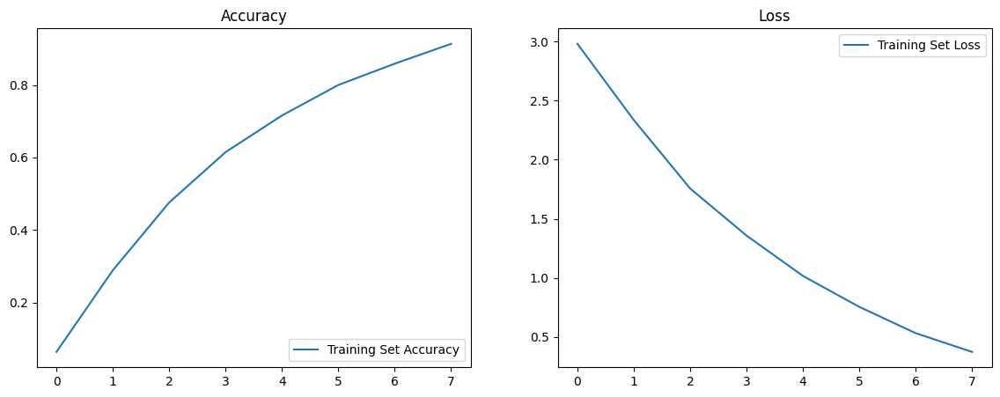

In [30]:
# Plotting model Accuracy and Loss (Visualisasi Plot Hasil Akurasi dan Loss)
# Plot Akurasi
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(train.history['accuracy'], label='Training Set Accuracy')
plt.legend(loc='lower right')
plt.title('Accuracy')
# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(train.history['loss'], label='Training Set Loss')
plt.legend(loc='upper right')
plt.title('Loss')
plt.show()

In [31]:
model.save('ScreningCV.h5')

print('Model Created Successfully!')

Model Created Successfully!


In [23]:
import PyPDF2

# Fungsi untuk mengekstrak teks dari dokumen PDF
def extract_text_from_pdf(pdf_path):
    text = ''
    with open(pdf_path, 'rb') as pdf_file:
        pdf_reader = PyPDF2.PdfReader(pdf_file)
        for page_num in range(len(pdf_reader.pages)):
            page = pdf_reader.pages[page_num]
            text += page.extract_text()
    return text

# Path ke dokumen PDF yang ingin diuji
pdf_path = 'business.pdf'  

# Ekstrak teks dari PDF
cv_text = extract_text_from_pdf(pdf_path)
print(cv_text)

BUSINESS DEVELOPMENT MANAGER, VP
Executive Profile
Ambitious leader who creates strategic alliances with organization leaders to effectively align with and support key business initiatives. Builds and
retains high performance teams by hiring, developing and motivating skilled professionals.
Skill Highlights
Multi-unit operations management
Change implementation/project management
Relationship and vendor management
Call center/dialer operations
Underwriting
Strategic planning
Operational Risk
Core Accomplishments
Operations Management: Managed multi-sites and units (150 FTE) Handled multiple functions related to customer care, collections, loss
mitigation, risk, foreclosure, and underwriting
Staff Development: Launched well-received program of professional development courses for all staff.
Mentored and coached employees resulting in a 12% increase in productivity.
Project Management: Created policies and procedures for external vendors.
Initiated audit checklist for vendors resulting i

In [2]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import load_model
import pickle
import numpy as np
# Buka file pickle label encoder
with open('label_encoder.pkl', 'rb') as le_file:
    label_encoder = pickle.load(le_file)

# Buka file pickle tokenizer
with open('tokenizers.pkl', 'rb') as tok_file:
    tokenizer = pickle.load(tok_file)
    
max_seq_length = 100

model = load_model('ScreningCV.h5')

# Tokenisasi dan embedding
new_cv_tokens = tokenizer.texts_to_sequences([cv_text])
# Jika panjang urutan kurang dari 4128, tambahkan padding
if len(new_cv_tokens[0]) < 4128:
    new_cv_tokens = pad_sequences(new_cv_tokens, maxlen=4128, padding='post')[0]

# Jika panjang urutan lebih dari 4128, potong sekuens
if len(new_cv_tokens) > 4128:
    new_cv_tokens = new_cv_tokens[:4128]

# Prediksi probabilitas untuk CV baru
predicted_probabilities = model.predict(np.array([new_cv_tokens]))

# Temukan kelas dengan probabilitas tertinggi
predicted_label = np.argmax(predicted_probabilities, axis=1)[0]

# Ubah label kembali ke kategori atau nama kelas
predicted_category = label_encoder.inverse_transform([predicted_label])[0]

print(f"Predicted Category: {predicted_category}")




c:\Users\PC\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.1.1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


ValueError: in user code:

    File "c:\Users\PC\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\training.py", line 1845, in predict_function  *
        return step_function(self, iterator)
    File "c:\Users\PC\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\training.py", line 1834, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "c:\Users\PC\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\training.py", line 1823, in run_step  **
        outputs = model.predict_step(data)
    File "c:\Users\PC\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\training.py", line 1791, in predict_step
        return self(x, training=False)
    File "c:\Users\PC\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\utils\traceback_utils.py", line 67, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "c:\Users\PC\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\input_spec.py", line 264, in assert_input_compatibility
        raise ValueError(f'Input {input_index} of layer "{layer_name}" is '

    ValueError: Input 0 of layer "model" is incompatible with the layer: expected shape=(None, 4334), found shape=(None, 4128)
